# Reviewing the Switch Matrix Simulation Data

Peter Kinget

- first version: July 21 2025
- update: July 23 2025

In [1]:
# if necessary install wave_view with `pip3 install yaml2plot`
import yaml2plot as wv

## Loading the simulation data

In [ ]:
# simulation_folder = "/foss/designs/libs/switch_matrix/docs/saved_simulations/"
simulation_folder = "saved_simulations/"
# raw_file = "tb_swmatrix.raw"
# raw_file = "tb_swmatrix_5_10_20250720b.raw.save"
# csv_file = "data_swmatrix5_10.csv"
raw_file = "tb_swmatrix_random_20250720b.raw.save"
csv_file = "random.csv"

raw_file_full = simulation_folder + raw_file
csv_file_full = simulation_folder + csv_file

In [3]:
data = wv.load_spice_raw(raw_file_full)

In [4]:
# data.keys()
# print(metadata)

## Checking the final values vs the input

## Gathering the register final values

In [5]:
# def print_digital_value(key, data, threshold = 1.5):
#     analog_value = data
#     digital_value = int(analog_value > threshold)
#     print(f"{key} {digital_value}")

def print_digital_value(key, data, threshold = 1.5):
    analog_value = data
    digital_value = int(analog_value > threshold)
    print(f"{digital_value} ", end='')
    return digital_value

print("Final values in the registers")
output = []
last_row = 5
last_bus = 10
for row in range(1,last_row+1):
    print(f"Row {row}: ", end='')
    for bus in range(1, last_bus):
        key = f"v(xswmatrix.xswmatrix_row[{row}].q[{bus}])"
        bit = print_digital_value(key, data[key][-1])
        output.append(bit)
    if row != last_row:
        key = f"v(xswmatrix.d_out_row[{row}])"
        bit = print_digital_value(key, data[key][-1])
        output.append(bit)
    else:
        key = f"v(d_out)"
        bit = print_digital_value(key, data[key][-1])
        output.append(bit)
    print()
# print(output)

Final values in the registers
Row 1: 1 0 0 0 0 0 1 0 0 1 
Row 2: 0 0 0 1 0 0 1 0 1 1 
Row 3: 0 0 0 0 0 1 0 0 0 0 
Row 4: 0 0 0 0 1 1 1 1 0 1 
Row 5: 1 1 1 0 0 0 1 1 0 0 


### Comparing it to the data_source csv

In [6]:
import csv
input_list = []
with open(csv_file_full, newline='') as f:
    reader = csv.reader(f)
    for row in reader:
        input_list.extend(row)
input_list = [ int(element) for element in input_list]

print("Input List")
print(input_list)
print("Register List (reversed order)")
print(output[::-1])
print(f"The registers are correctly loaded: {input_list == output[::-1]}")

Input List
[0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]
Register List (reversed order)
[0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1]
The registers are correctly loaded: True


## Reviewing plots for key signals

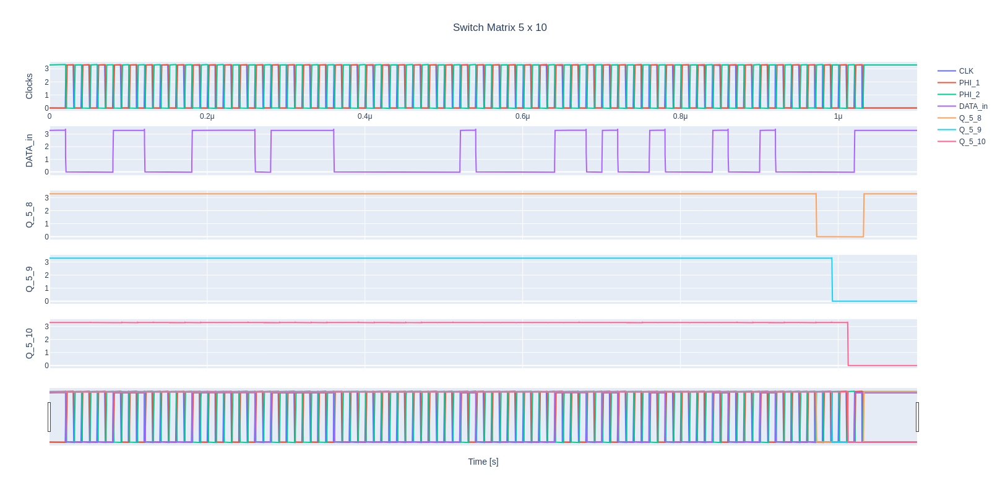

In [7]:
spec = wv.PlotSpec.from_yaml("""
height: 800
width: 1200
title: "Switch Matrix 5 x 10"
x:
    label: "Time [s]"
    signal: "time"
y:
  - label: "Clocks"
    signals:
        CLK: "v(clock)"
        PHI_1: "v(phi_1)"
        PHI_2: "v(phi_2)"
  - label: "DATA_in"
    signals:
        DATA_in: "v(data_in)"
  - label: "Q_5_8"
    signals: 
        Q_5_8: "v(xswmatrix.xswmatrix_row[5].q[8])"
  - label: "Q_5_9"
    signals: 
        Q_5_9: "v(xswmatrix.xswmatrix_row[5].q[9])"
  - label: "Q_5_10"
    signals: 
        Q_5_10: "v(d_out)"
""")
fig = wv.plot(data,spec)

## Plotting all Register outputs

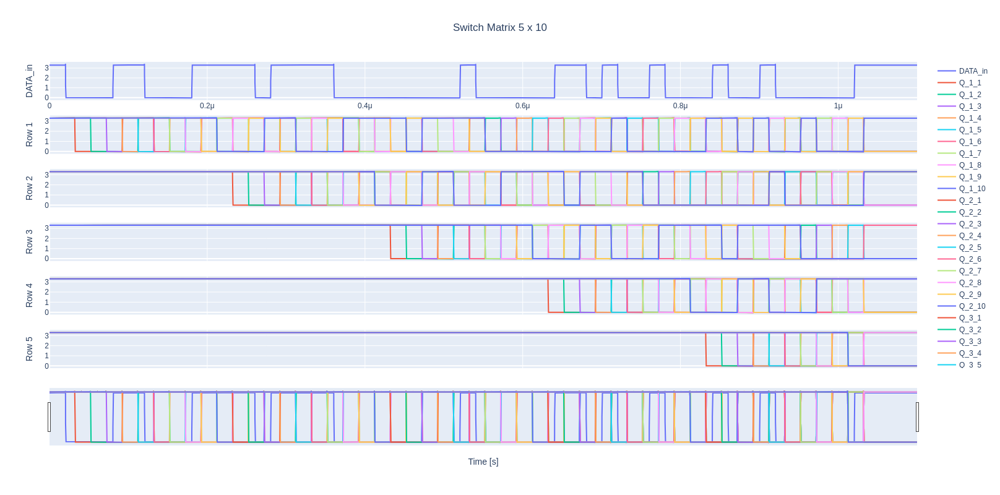

In [8]:
def add_row_label(plot_spec, row):
    plot_spec = plot_spec + f'  - label: "Row {row}"\n    signals:\n'
    return plot_spec
    
def add_signal(plot_spec, key, name):
    plot_spec = plot_spec + f'        {name}: "{key}"\n'
    return plot_spec

plot_spec = """
height: 800
width: 1200
title: "Switch Matrix 5 x 10"
x:
    label: "Time [s]"
    signal: "time"
y:
  - label: "DATA_in"
    signals:
        DATA_in: "v(data_in)"

"""

last_row = 5
last_bus = 10
for row in range(1,last_row+1):
    plot_spec = add_row_label(plot_spec,row)
    for bus in range(1, last_bus):
        key = f"v(xswmatrix.xswmatrix_row[{row}].q[{bus}])"
        plot_spec = add_signal(plot_spec, key, f"Q_{row}_{bus}")
    if row != last_row:
        key = f"v(xswmatrix.d_out_row[{row}])"
        plot_spec = add_signal(plot_spec, key, f"Q_{row}_{last_bus}")
    else:
        key = f"v(d_out)"
        plot_spec = add_signal(plot_spec, key, f"Q_{row}_{last_bus}")
        
# print(plot_spec)
fig = wv.plot(data,wv.PlotSpec.from_yaml(plot_spec))